# SETUP 

In [30]:
!pip install pm4py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [31]:
import os
import pandas as pd
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.objects.conversion.log import converter as log_converter
import pm4py
import math

from google.colab import drive
drive.mount('/content/drive')

data_path = '/content/drive/MyDrive/BIS/data/'

list_files_xes = [
                  {"domestic_declarations": f'{data_path}DomesticDeclarations.xes'}, 
                  {"international_declarations" : f'{data_path}InternationalDeclarations.xes'}, 
                  {"permit_log" : f'{data_path}PermitLog.xes'}, 
                  {"prepaid_travel_cost" : f'{data_path}PrepaidTravelCost.xes'}, 
                  {"request_payment" :f'{data_path}RequestForPayment.xes'}
                 ]


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# SHOW ALL LOGS

In [32]:
def read_xes_file(file_path):
  return pm4py.read_xes(file_path)

def temporal_filter_range(log, start_period, end_period):
  return pm4py.filter_time_range(log, start_period, end_period, mode='traces_contained')

In [33]:
dict_of_logs = {k : read_xes_file(v) for file_xes in list_files_xes for k,v in file_xes.items()}

parsing log, completed traces ::   0%|          | 0/10500 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/6449 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/7065 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/2099 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/6886 [00:00<?, ?it/s]

,
domestic_declarations,10500
international_declarations,6449
permit_log,7065
prepaid_travel_cost,2099
request_payment,6886


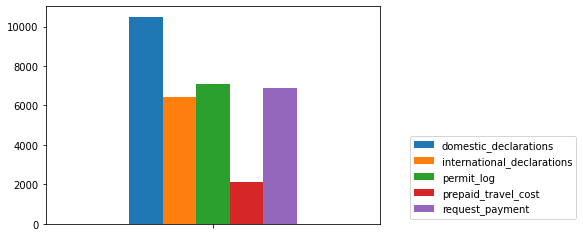

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

len_dict_of_logs = {k : len(dict_of_logs[k]) for file_xes in list_files_xes for k in file_xes.keys()}
    
#create plot of the values    
df = pd.DataFrame(len_dict_of_logs, index=[''])
df.plot.bar()
plt.legend(list(df.keys()), loc='lower right', bbox_to_anchor=(.0, .0, 1.6, 0))

df.T

# TEMPORAL FILTERING WITH PM4PY

In [35]:
filtered_from_2018 =  {k:temporal_filter_range(dict_of_logs[k], '2018-01-01 00:00:00', '2021-12-31 23:59:59') for k in dict_of_logs.keys()}

,
domestic_declarations,8260
international_declarations,4952
permit_log,5598
prepaid_travel_cost,1776
request_payment,5778


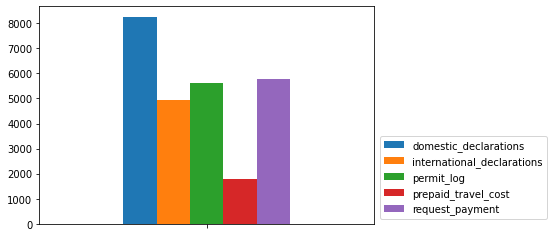

In [36]:
df = pd.DataFrame({k : len(filtered_from_2018[k]) for k in filtered_from_2018.keys()}, index=[''])
df.plot.bar()
plt.legend(list(df.keys()), loc='lower right', bbox_to_anchor=(.0, .0, 1.53, 0))
df.T

,
domestic_declarations,2240
international_declarations,1497
permit_log,1467
prepaid_travel_cost,323
request_payment,1108


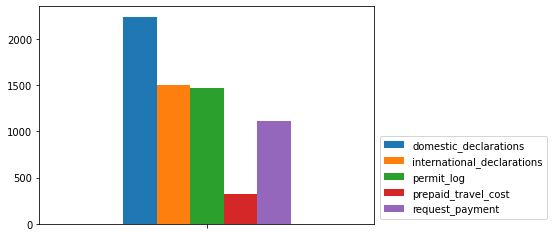

In [37]:
df = pd.DataFrame({k: len(dict_of_logs[k]) - len(filtered_from_2018[k]) for k in filtered_from_2018.keys()}, index=[''])
df.plot.bar()
plt.legend(list(df.keys()), loc='lower right', bbox_to_anchor=(.0, .0, 1.53, .0))
df.T

# THROUGHTPUT & BOTTLENECK

Calculates the throughput of events between from_ and to, showing the minimum, average, and maximum time

In [38]:
import datetime
def chop_microseconds(delta):
  return datetime.timedelta(seconds=math.ceil(delta.total_seconds()))

def get_throughput(log, from_, to):
  res =[]

  for trace in log:
    timestamp = {'from': None, 'to': None }
    for e in trace:
      if e['concept:name'] == from_:
        timestamp.update({'from': e['time:timestamp'] })
      elif e['concept:name'] == to:
        timestamp.update({'to': e['time:timestamp'] })
        break

    if None not in timestamp.values():
        res.append(timestamp['to'] - timestamp['from'])          

  return res

In [39]:
result = { 'min' : [], 'avarage' : [], 'median': [], 'max' : []}

list_of_event = [
                ('Declaration SUBMITTED by EMPLOYEE', 'Request Payment'),
                ('Declaration SUBMITTED by EMPLOYEE', 'Payment Handled'),
                ('Request Payment', 'Payment Handled'),
               ]
for from_, to in list_of_event:
  result['min'].append(
      {k: chop_microseconds(pd.to_timedelta(get_throughput(filtered_from_2018[k], from_, to)).min())
      for k in ['domestic_declarations', 'international_declarations','permit_log']})
  
  result['avarage'].append(
      {k: chop_microseconds(pd.to_timedelta(get_throughput(filtered_from_2018[k], from_, to)).mean())
      for k in ['domestic_declarations', 'international_declarations','permit_log']})
  
  result['median'].append(
      {k: chop_microseconds(pd.to_timedelta(get_throughput(filtered_from_2018[k], from_, to)).median())
      for k in ['domestic_declarations', 'international_declarations', 'permit_log']})
  
  result['max'].append(
      {k: chop_microseconds(pd.to_timedelta(get_throughput(filtered_from_2018[k], from_, to)).max())
      for k in ['domestic_declarations', 'international_declarations', 'permit_log']})

In [40]:
title = 'Min Throughput year 2018'

df = pd.DataFrame(data=  result['min'] )
df.index = [f" %s   ↔   %s" % (i) for i in list_of_event]

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
    ]
}])
styler.set_properties(**{'text-align': 'center'})


display(styler)

,domestic_declarations,international_declarations,permit_log
Declaration SUBMITTED by EMPLOYEE ↔ Request Payment,0 days 00:01:26,0 days 00:08:45,0 days 00:08:45
Declaration SUBMITTED by EMPLOYEE ↔ Payment Handled,1 days 01:33:30,1 days 00:55:52,0 days 00:15:35
Request Payment ↔ Payment Handled,0 days 02:19:06,0 days 00:39:32,0 days 01:15:38


In [41]:
title = 'Average Throughput year 2018'

df = pd.DataFrame(data=  result['avarage'] )
df.index = [f"%s ↔ \t %s" % (i) for i in list_of_event]

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
    ]
}])
styler.set_properties(**{'text-align': 'center'})


display(styler)

,domestic_declarations,international_declarations,permit_log
Declaration SUBMITTED by EMPLOYEE ↔ Request Payment,6 days 20:02:17,8 days 20:08:45,8 days 15:09:06
Declaration SUBMITTED by EMPLOYEE ↔ Payment Handled,10 days 08:26:27,12 days 09:04:19,12 days 04:15:05
Request Payment ↔ Payment Handled,3 days 10:48:26,3 days 09:58:51,3 days 10:55:07


In [42]:
title = 'Median Throughput year 2018'

df = pd.DataFrame(data=  result['median'] )
df.index = [f"%s ↔ \t %s" % (i) for i in list_of_event]

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
    ]
}])

styler.set_properties(**{'text-align': 'center'})

display(styler)

,domestic_declarations,international_declarations,permit_log
Declaration SUBMITTED by EMPLOYEE ↔ Request Payment,4 days 16:46:14,6 days 01:00:54,5 days 23:31:28
Declaration SUBMITTED by EMPLOYEE ↔ Payment Handled,7 days 07:48:38,9 days 06:27:53,9 days 05:20:25
Request Payment ↔ Payment Handled,3 days 05:07:54,3 days 05:38:01,3 days 05:42:01


In [43]:
title = 'Max Throughput year 2018'

df = pd.DataFrame(data=  result['max'] )
df.index = [f"%s ↔ \t %s" % (i) for i in list_of_event]

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
    ]
}])

styler.set_properties(**{'text-align': 'center'})

display(styler)

,domestic_declarations,international_declarations,permit_log
Declaration SUBMITTED by EMPLOYEE ↔ Request Payment,287 days 20:50:27,427 days 22:19:35,349 days 15:46:59
Declaration SUBMITTED by EMPLOYEE ↔ Payment Handled,290 days 21:43:55,429 days 02:42:28,349 days 19:32:36
Request Payment ↔ Payment Handled,62 days 03:28:59,29 days 01:27:49,29 days 01:27:49


# REJECTED DECLARATIONS

Analyse how many domestic and international declarations have been booked on trips 


In [77]:
def name_event_is_contain(trace, name_of_event):
  for e in trace:
      if name_of_event in e["concept:name"]:
        return True
  return False

In [78]:
def get_total_booked(log):
  is_booked = 0
  for trace in log:
    is_booked += 1 if name_event_is_contain(trace, "Payment Handled" ) else 0
  return is_booked   

In [79]:
def get_total_reject(log):
  total_rejects = 0
  for trace in log:
    total_rejects += 1 if name_event_is_contain(trace, "Declaration REJECTED" ) else 0
  return total_rejects
  

In [80]:
df = pd.DataFrame(data= {k: {'number_of_trace' : len(filtered_from_2018[k]), 
                             'total_booked' : get_total_booked(filtered_from_2018[k]),
                             'total_reject': get_total_reject(filtered_from_2018[k])} 
                         for k in ['domestic_declarations','international_declarations']})

title = 'Total Booked & Rejected'

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
        ('text-align', 'center')
    ]
}])
styler.set_properties(**{'text-align': 'center'})
display(styler)

,domestic_declarations,international_declarations
number_of_trace,8260,4952
total_booked,7903,4741
total_reject,1072,1351


In [89]:
def get_never_approve():  
  res = []
  for k in ['domestic_declarations','international_declarations']:
    never_approve = 0
    for trace in filtered_from_2018[k]:
      never_approve += 0 if name_event_is_contain(trace, 'FINAL_APPROVED') else 1
    res.append({'number_of_trace' : len(filtered_from_2018[k]), 
                'never_approve': never_approve})
  return res

In [90]:
title = 'Never Approve'

df = pd.DataFrame(data=get_never_approve())

df.index = ['Domestic Declaration', 'International Declaration']

styler = df.style.set_caption(title).set_table_styles([{
    'selector': 'caption',
    'props': [
        ('color', 'red'),
        ('font-weight', 'bold'),
        ('text-align', 'center')
    ]
}])
styler.set_properties(**{'text-align': 'center'})


display(styler)

,number_of_trace,never_approve
Domestic Declaration,8260,357
International Declaration,4952,16


# DOUBLE PAYMENT

In [49]:
def double_payment(log):
  payment_done = []
  double_payment = 0
  total_declarated= []
  overspent =[] 
  underspent = []
  for trace in log:
        for e in trace:
          if e['concept:name'] == 'Payment Handled':
            if trace.attributes['concept:name'] not in payment_done : 
              payment_done.append( trace.attributes['concept:name'] ) 
            else:
              total_declarated.append(trace.attributes["TotalDeclared"])
              if trace.attributes["Overspent"]:
                overspent.append(trace.attributes["OverspentAmount"])
              else:
                underspent.append(trace.attributes["OverspentAmount"])
             

  return [len(total_declarated), round(sum(total_declarated),2), len(overspent), round(sum(overspent),2),len(underspent), round(sum(underspent),2),round(sum(overspent)+sum(underspent),2)]

In [50]:
df = pd.DataFrame(data= {k: double_payment(filtered_from_2018[k]) for k in filtered_from_2018.keys()}, index=['NUMBER OF DOUBLE PAYMENT', 'TOTAL DECLARATION SPENT', 'NUMBER OF OVERSPENT','OVERSPENT AMOUNT',  'NUMBER OF UNDERSPENT','UNDERSPENT AMOUNT','TOTAL OVERSPENT'])
df.T

,NUMBER OF DOUBLE PAYMENT,TOTAL DECLARATION SPENT,NUMBER OF OVERSPENT,OVERSPENT AMOUNT,NUMBER OF UNDERSPENT,UNDERSPENT AMOUNT,TOTAL OVERSPENT
domestic_declarations,0.0,0.00,0.0,0.00,0.0,0.0,0.00
international_declarations,0.0,0.00,0.0,0.00,0.0,0.0,0.00
permit_log,1521.0,4478896.22,693.0,1913662.91,828.0,-745892.7,1167770.22
prepaid_travel_cost,0.0,0.00,0.0,0.00,0.0,0.0,0.00
request_payment,0.0,0.00,0.0,0.00,0.0,0.0,0.00


# PROCESS MINING

In [51]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

def alpha_miner_model(log, show = False):
  log = log_converter.apply(log)
  net, im, fm = alpha_miner.apply(log)
  if show :
    gviz = pn_visualizer.apply(net, im, fm, variant=pn_visualizer.Variants.FREQUENCY, log=log)
    pn_visualizer.view(gviz)
  return net, im, fm


In [52]:
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner

def heuristics_miner_model(log, show=False):
  log = log_converter.apply(log)

  heu_net = heuristics_miner.apply_heu(log)
  if show :
    gviz = hn_visualizer.apply(heu_net)
    hn_visualizer.view(gviz)
  
  print('\n\n\n')
  net, im, fm = heuristics_miner.apply(log)
  # Petri net visualisation
  if show :
    gviz = pn_visualizer.apply(net, im, fm, variant=pn_visualizer.Variants.FREQUENCY,log=log)
    pn_visualizer.view(gviz)
  
  return net, im, fm

In [53]:
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer

def inductive_miner_model(log, variant=inductive_miner.DEFAULT_VARIANT_LOG, parameters= None, show=False):
  log = log_converter.apply(log)
  net, im, fm = inductive_miner.apply(log, variant=variant, parameters=parameters)
  if show :
    gviz = pn_visualizer.apply(net, im, fm, variant=pn_visualizer.Variants.FREQUENCY, log=log)
    pn_visualizer.view(gviz)
  return net, im, fm

In [54]:
def token_replay(log):
  net, im, fm = pm4py.discover_petri_net_alpha(log)
  return net, im, fm 
 

In [55]:
from numpy import tracemalloc_domain
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
import math 
from statistics import mean

def get_statistic_model(log, net, im, fm):
    fitness = pm4py.fitness_token_based_replay(log, net, im, fm)
    prec = pm4py.precision_token_based_replay(log, net, im, fm)
    gen = generalization_evaluator.apply(log, net, im, fm)
    simp = simplicity_evaluator.apply(net)
    replayed_traces = pm4py.conformance_diagnostics_token_based_replay(log, net, im, fm)

    return {'fitness' : round(fitness['average_trace_fitness'],2), 
            'precision' : round(prec,2), 
            'generalization' : round(gen,2), 
            'semplicity' : round(simp,2), 
            'Token Replay' : round( mean([i['trace_fitness'] for i in replayed_traces]),2) 
            }

In [56]:
def comparison_statistic(filtered_log):
  result = {}
  for k in filtered_log.keys():
    result.update({k: []})
    net, im, fm = alpha_miner_model(filtered_log[k])  
    result[k].append({'AM' : get_statistic_model(filtered_log[k], net, im, fm) })
    net, im, fm = heuristics_miner_model(filtered_log[k])  
    result[k].append({'HM' : get_statistic_model(filtered_log[k], net, im, fm) } )
    net, im, fm = inductive_miner_model(filtered_log[k]) 
    result[k].append({'IM' : get_statistic_model(filtered_log[k], net, im, fm) } )
    net, im, fm = inductive_miner_model(filtered_log[k], variant = inductive_miner.Variants.IMf, parameters = {inductive_miner.Variants.IMf:0.5} ) 
    result[k].append({'IMf' : get_statistic_model(filtered_log[k], net, im, fm) } )
    net, im, fm = inductive_miner_model(filtered_log[k], variant = inductive_miner.Variants.IMd) 
    result[k].append({'IMd' : get_statistic_model(filtered_log[k], net, im, fm) } )
  return result

In [57]:
for k,v in comparison_statistic(filtered_from_2018).items():
  print( k, '\n')
  for list_value in v :
    for k1, v1 in list_value.items() :
      print(f'{k1} : {v1}')
  print('\n\n')

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/214 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/214 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/214 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/214 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/214 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2864 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2864 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2864 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2864 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/2864 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/9871 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/9871 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/9871 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/9871 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/9871 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/710 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/710 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/710 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/710 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/710 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/188 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/188 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/188 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/188 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/188 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

domestic_declarations 

AM : {'fitness': 0.85, 'precision': 0.33, 'generalization': 0.88, 'semplicity': 0.56, 'Token Replay': 0.85}
HM : {'fitness': 0.99, 'precision': 0.89, 'generalization': 0.88, 'semplicity': 0.67, 'Token Replay': 0.99}
IM : {'fitness': 1.0, 'precision': 0.53, 'generalization': 0.89, 'semplicity': 0.67, 'Token Replay': 1.0}
IMf : {'fitness': 0.99, 'precision': 0.65, 'generalization': 0.88, 'semplicity': 0.74, 'Token Replay': 0.99}
IMd : {'fitness': 1.0, 'precision': 0.27, 'generalization': 0.86, 'semplicity': 0.63, 'Token Replay': 1.0}



international_declarations 

AM : {'fitness': 0.68, 'precision': 0.0, 'generalization': 0.85, 'semplicity': 0.42, 'Token Replay': 0.68}
HM : {'fitness': 0.95, 'precision': 0.91, 'generalization': 0.8, 'semplicity': 0.53, 'Token Replay': 0.95}
IM : {'fitness': 1.0, 'precision': 0.1, 'generalization': 0.89, 'semplicity': 0.53, 'Token Replay': 1.0}
IMf : {'fitness': 0.97, 'precision': 0.4, 'generalization': 0.95, 'semplicity': 0.67, '

---

***PROCESS MINING WITH HEURISTIC MINER***

---

DOMESTIC DECLARATION

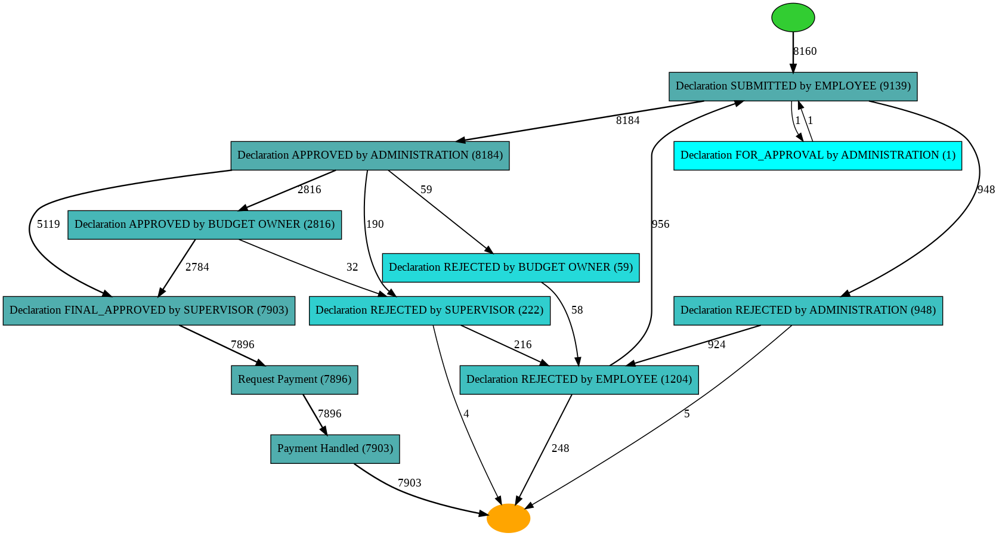

replaying log with TBR, completed variants ::   0%|          | 0/63 [00:00<?, ?it/s]

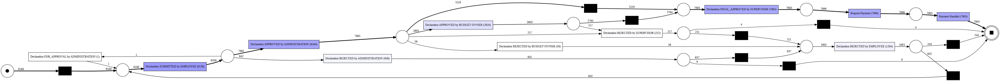

In [58]:
net, im, fm =heuristics_miner_model(filtered_from_2018['domestic_declarations'], show=True)  

INTERNATIONAL DECLARATION

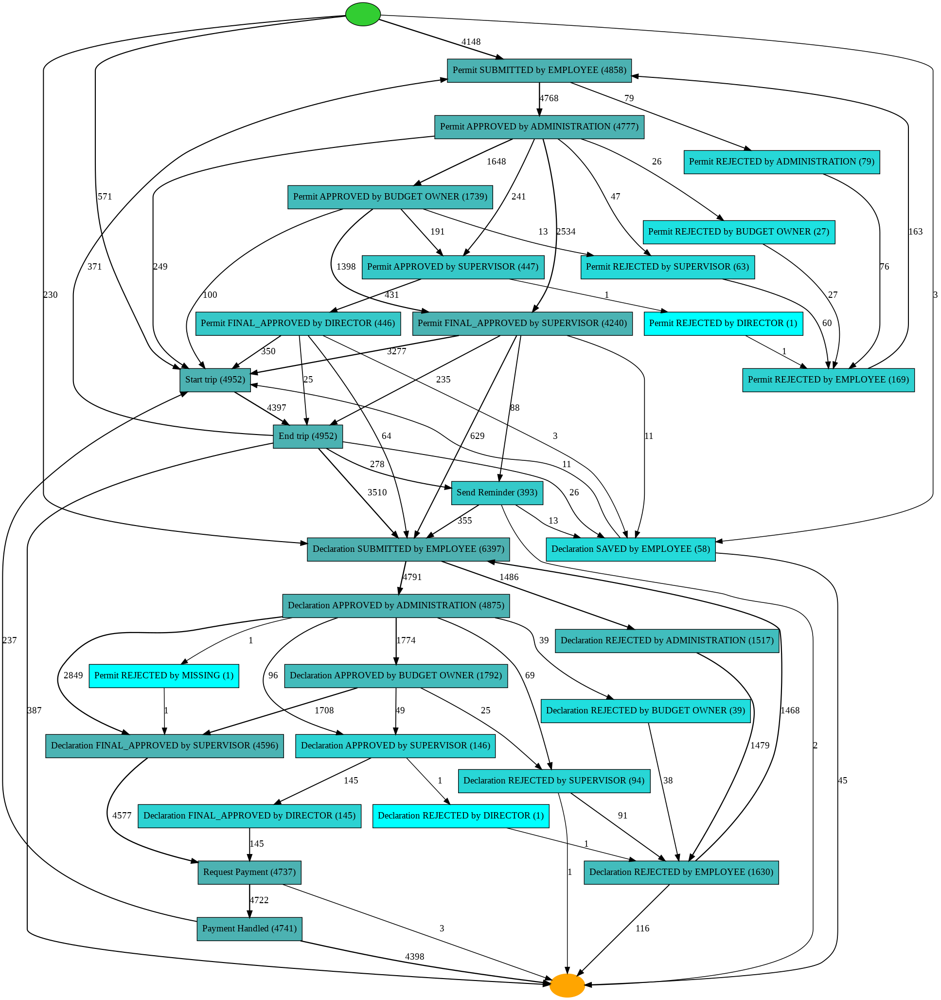

replaying log with TBR, completed variants ::   0%|          | 0/523 [00:00<?, ?it/s]

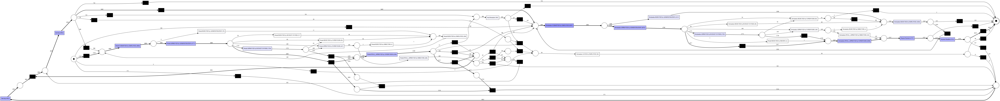

In [59]:
net, im, fm =heuristics_miner_model(filtered_from_2018['international_declarations'], show=True)  

PERMIT LOG

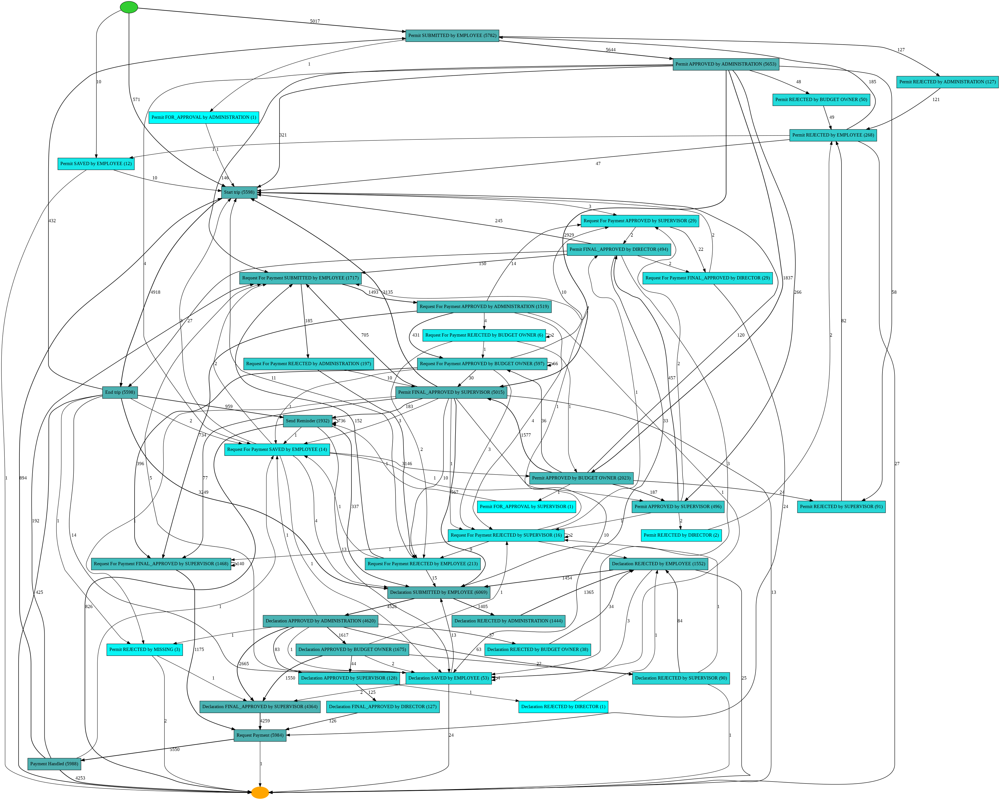

replaying log with TBR, completed variants ::   0%|          | 0/1115 [00:00<?, ?it/s]

In [60]:
net, im, fm =heuristics_miner_model(filtered_from_2018['permit_log'], show=True)  

PREPAID TRAVEL COST

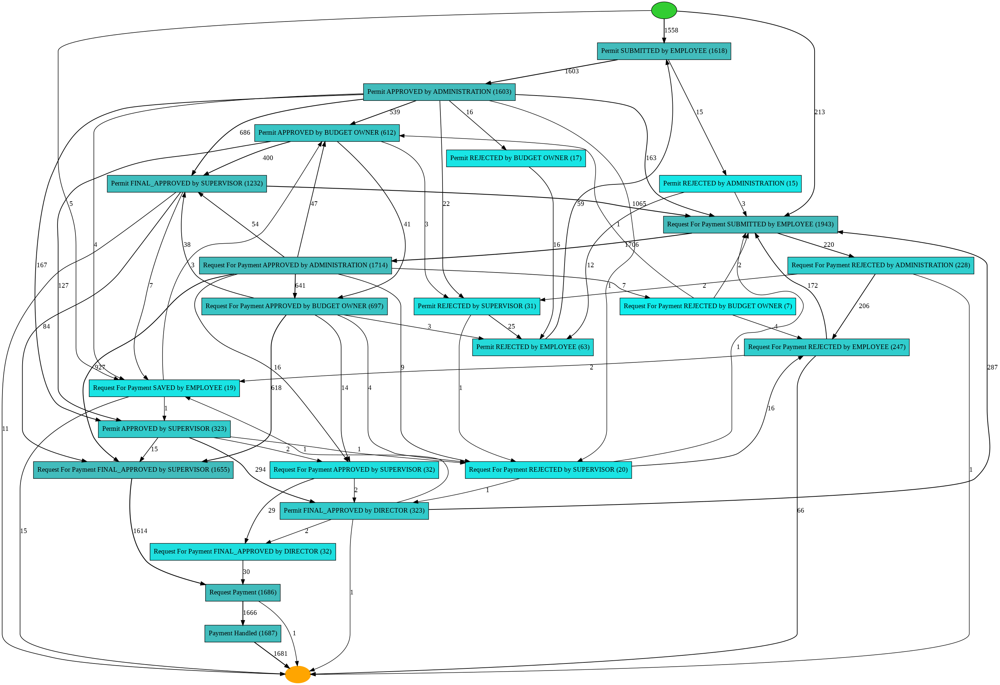

replaying log with TBR, completed variants ::   0%|          | 0/150 [00:00<?, ?it/s]

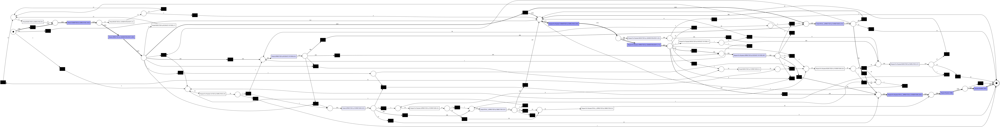

In [61]:
net, im, fm =heuristics_miner_model(filtered_from_2018['prepaid_travel_cost'], show=True)  

REQUEST PAYMENT

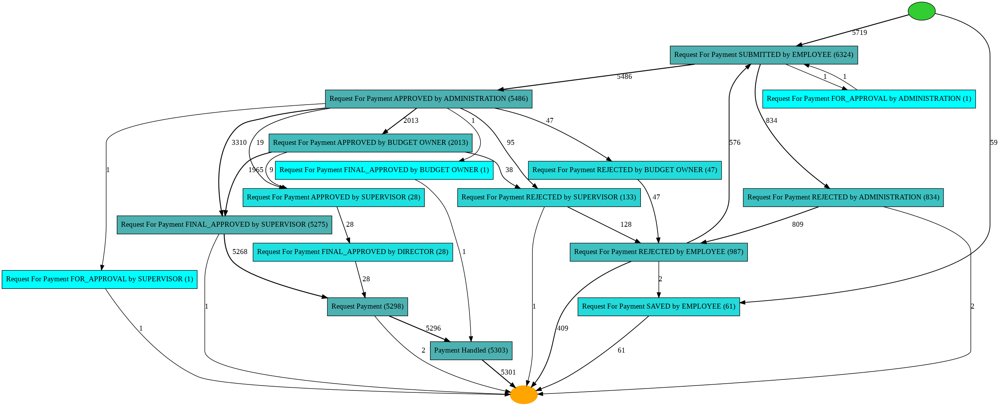

replaying log with TBR, completed variants ::   0%|          | 0/59 [00:00<?, ?it/s]

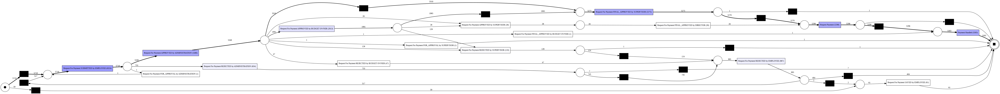

In [62]:
net, im, fm =heuristics_miner_model(filtered_from_2018['request_payment'], show=True)  

# PROCESS MINING WITH 5 VARIANTS

In [63]:
filtered_log_variants = {k : pm4py.filter_variants_top_k(filtered_from_2018[k], 5) for k in filtered_from_2018.keys()}

In [64]:
for k,v in comparison_statistic(filtered_log_variants).items():
  print( k, '\n')
  for list_value in v :
    for k1, v1 in list_value.items() :
      print(f'{k1} : {v1}')
  print('\n\n')

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/40 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/36 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/36 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/36 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/36 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/36 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/32 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/32 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/32 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/32 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/32 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/16 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

domestic_declarations 

AM : {'fitness': 0.85, 'precision': 1.0, 'generalization': 0.98, 'semplicity': 0.82, 'Token Replay': 0.85}
HM : {'fitness': 1.0, 'precision': 0.99, 'generalization': 0.98, 'semplicity': 0.85, 'Token Replay': 1.0}
IM : {'fitness': 1.0, 'precision': 0.86, 'generalization': 0.98, 'semplicity': 0.81, 'Token Replay': 1.0}
IMf : {'fitness': 1.0, 'precision': 0.75, 'generalization': 0.98, 'semplicity': 0.79, 'Token Replay': 1.0}
IMd : {'fitness': 0.88, 'precision': 0.24, 'generalization': 0.86, 'semplicity': 0.67, 'Token Replay': 0.88}



international_declarations 

AM : {'fitness': 0.84, 'precision': 1.0, 'generalization': 0.97, 'semplicity': 0.74, 'Token Replay': 0.84}
HM : {'fitness': 1.0, 'precision': 0.81, 'generalization': 0.97, 'semplicity': 0.8, 'Token Replay': 1.0}
IM : {'fitness': 1.0, 'precision': 0.5, 'generalization': 0.98, 'semplicity': 0.76, 'Token Replay': 1.0}
IMf : {'fitness': 1.0, 'precision': 0.65, 'generalization': 0.98, 'semplicity': 0.82, 'Token

---

***PROCESS MINING WITH HEURISTIC MINER***


---

DOMESTIC DECLARATION

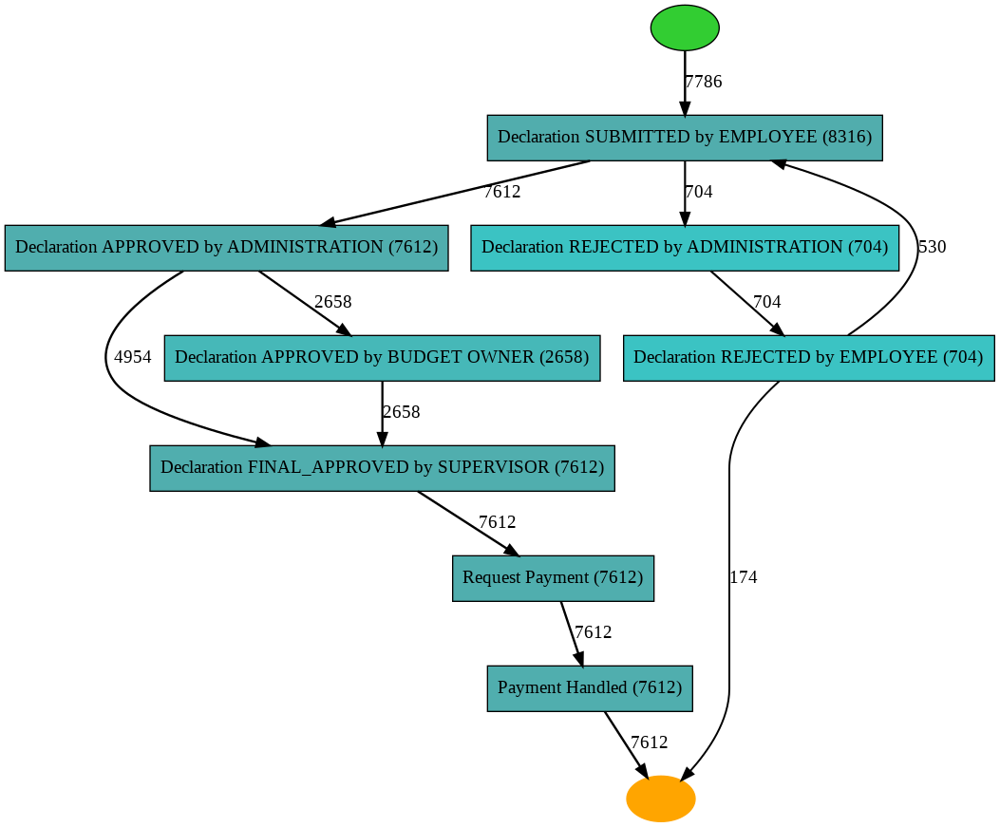

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

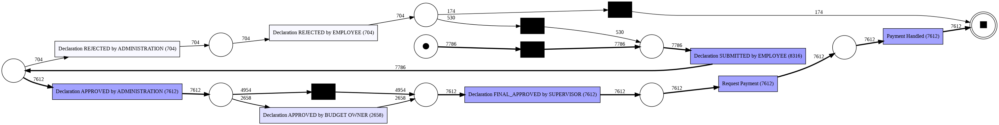

In [65]:
net, im, fm =heuristics_miner_model(filtered_log_variants['domestic_declarations'], show=True)  

INTERNATIONAL DECLARATION

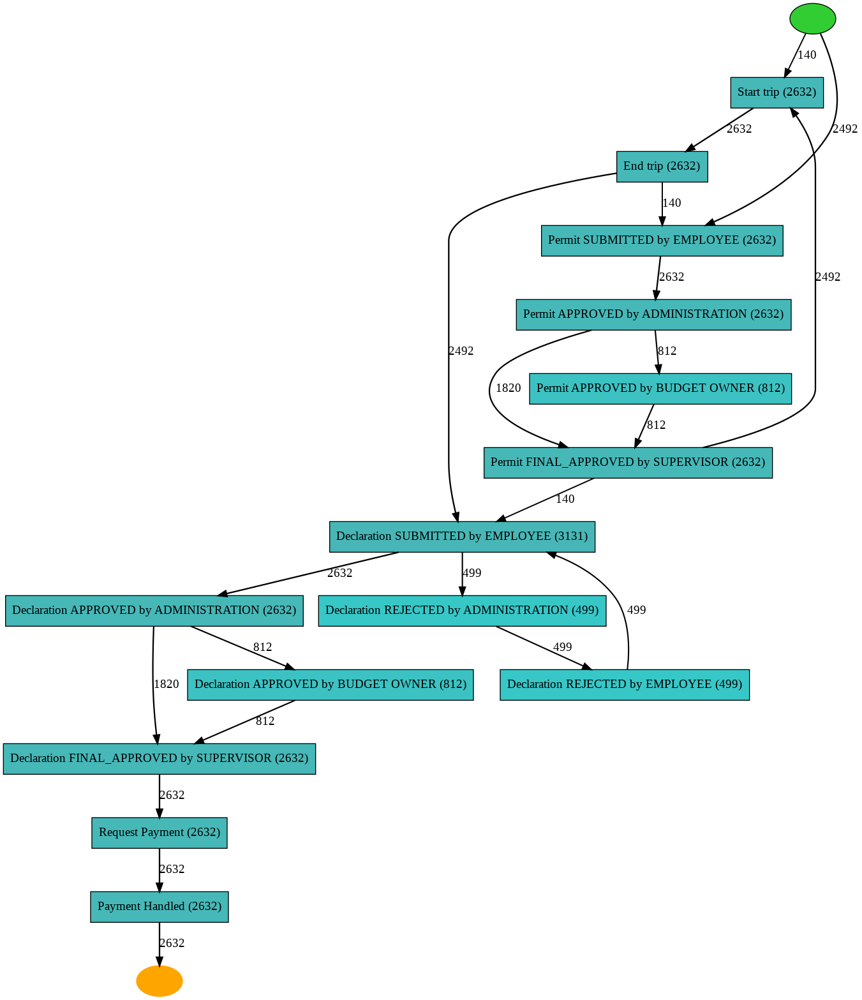

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

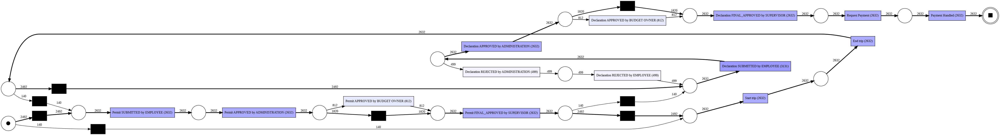

In [66]:
net, im, fm =heuristics_miner_model(filtered_log_variants['international_declarations'], show=True)  

PERMIT LOG

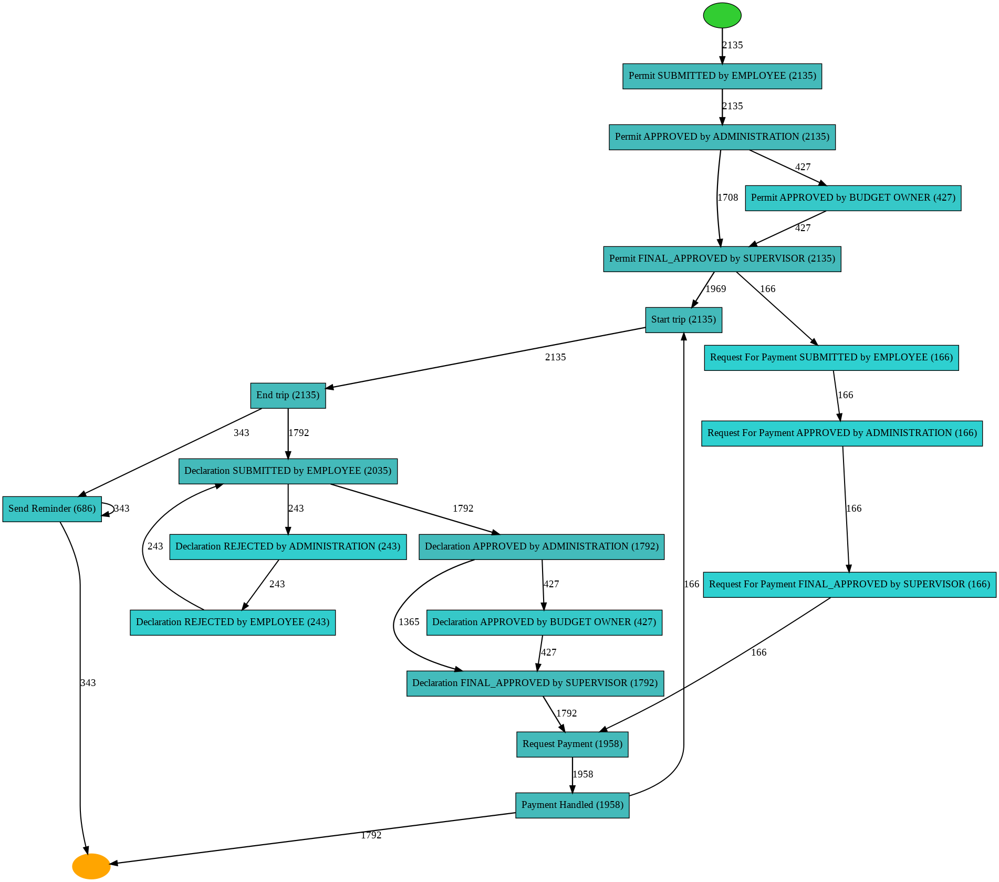

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

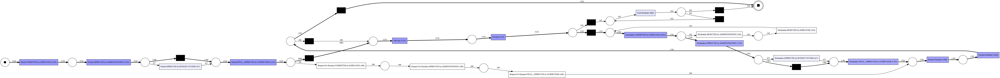

In [67]:
net, im, fm =heuristics_miner_model(filtered_log_variants['permit_log'], show=True)  

PREPAID TRAVEL COST

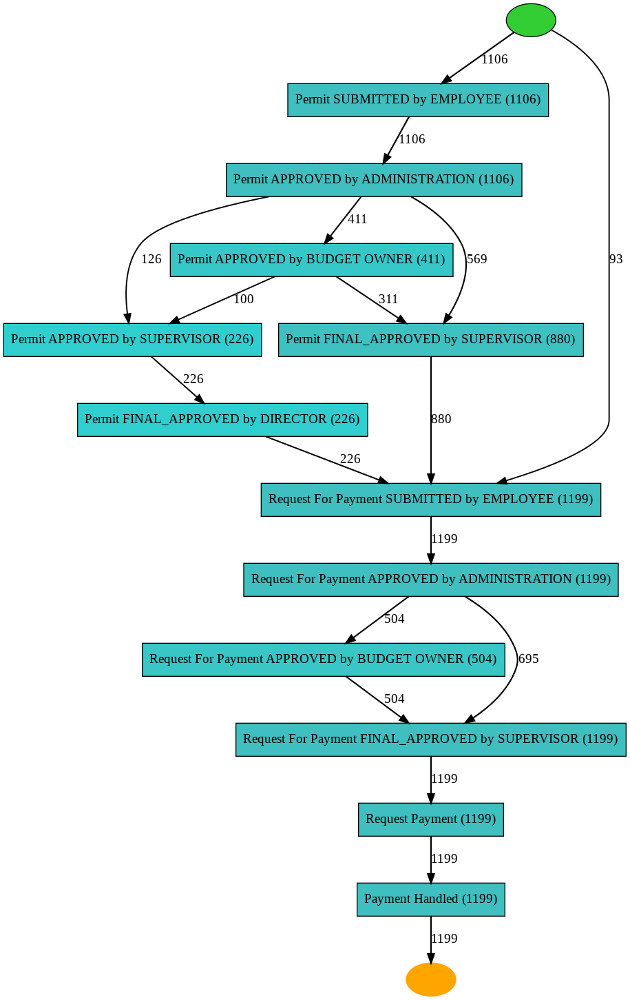

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

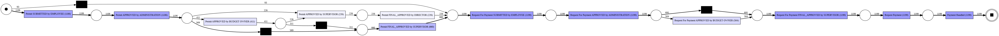

In [68]:
net, im, fm =heuristics_miner_model(filtered_log_variants['prepaid_travel_cost'], show=True)  

REQUEST PAYMENT

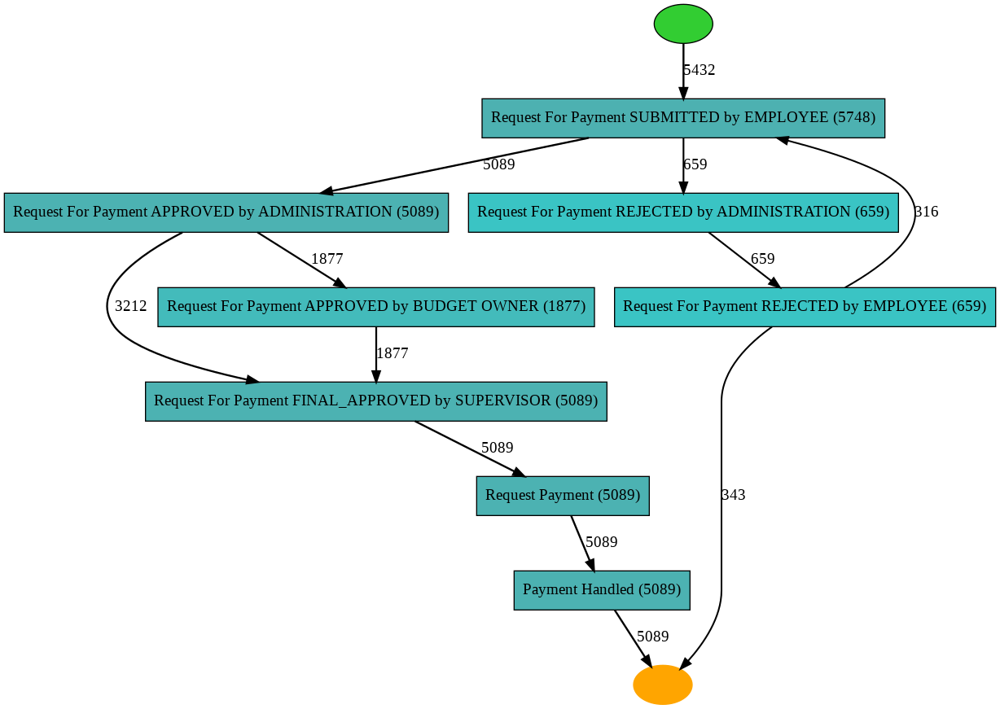

replaying log with TBR, completed variants ::   0%|          | 0/5 [00:00<?, ?it/s]

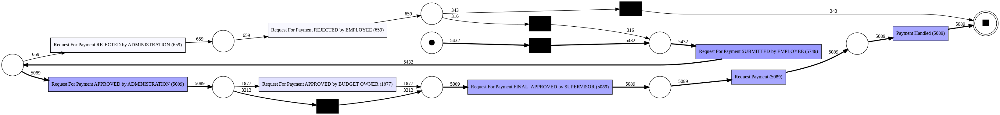

In [69]:
net, im, fm =heuristics_miner_model(filtered_log_variants['request_payment'], show=True)  